In [1]:
from process_T_c_data import points, data
import numpy as np
from scipy.interpolate import griddata, interp2d, interp1d
import matplotlib.pyplot as plt
from matplotlib import ticker

try:
    plt.rc('text', usetex=True)
    plt.rc('font', family='serif', size=12)
except:
    pass

def inv(points, time=1e7):
    ''' returns a 1D array'''
    values = []
    for p in points:
        for d in data:
            if d["T"] == p[0] and d["c"] == p[1]:
                values.append(interp1d(d["t"], d["inventory"])(time))
                break
    return np.asarray(values)

# with inference-tools
e = 12e-3  # monoblock thickness
points2 = []
z = []
for p in points:
    if 320 <= p[0] <= 1100 and 1e20 <= p[1] <= 1e23:
        points2.append([p[0], np.log10(p[1])])
        z.append(np.log10(e*inv([p], time=1e7)))
points2 = np.array(points2)

# removing some point for efficiency
# step = 3
# points2 = points2[0: -1: step]
# z = z[0: -1: step]

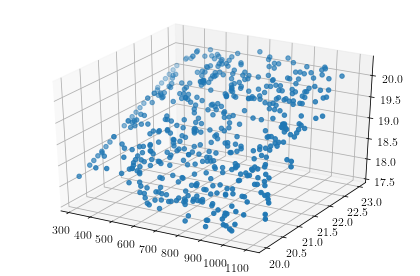

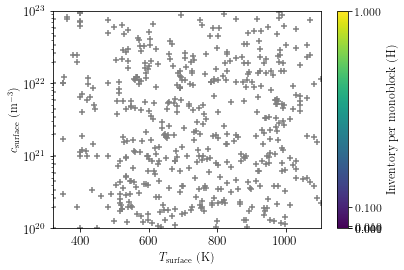

In [2]:
def scientificNotation(value):
    if value == 0:
        return '0'
    else:
        e = np.log10(np.abs(value))
        m = np.sign(value) * 10 ** (e - int(e))
        return r'${:.0f} \times 10^{{{:d}}}$'.format(m, int(e))

# scatter the dots
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter([i[0] for i in points2], [i[1] for i in points2], z)
plt.tight_layout()
plt.show()

factor_x = 1#0.83
factor_y = 1#0.93
# plt.figure(figsize=(6.4*factor_y, 4.8*factor_x))
CS = plt.scatter([i[0] for i in points2], [10**i[1] for i in points2], marker="+", color=(0.5, 0.5, 0.5))
plt.xlabel(r"$T_\mathrm{surface}$ (K)", fontsize=12)
plt.ylabel(r"$c_\mathrm{surface}$ (m$^{-3}$)", fontsize=12)
plt.xlim(320, 1100)
plt.ylim(1e20, 1e23)

cbar = plt.colorbar(CS, label=r"Inventory per monoblock (H)", ticks=ticker.LogLocator(base=10))# to be removed
plt.yscale("log")
plt.tick_params(axis='both', which='major', labelsize=13)
plt.savefig("points.svg")
plt.show()

In [3]:
# Train the GP on the data
from inference.gp_tools import GpRegressor
from inference.gp_tools import RationalQuadratic, SquaredExponential

import time

points3 = np.array([e for e in points2])
z3 = np.array([e for e in z])

N, times = [], []
steps = [3]
for step in steps:
    points2 = points3[0: -1: step]
    z = z3[0: -1: step]
    t = time.time()
    GP = GpRegressor(points2, z, kernel=RationalQuadratic)

    # evaluate the estimate
    Nx, Ny = 50, 10
    gp_x = np.linspace(320, 1100, Nx)
    gp_y = np.log10(np.logspace(20, 23, Ny))
    gp_coords = [(i, j) for i in gp_x for j in gp_y]
    mu, sig = GP(gp_coords)
    times.append(time.time() - t)
    N.append(len(points2))


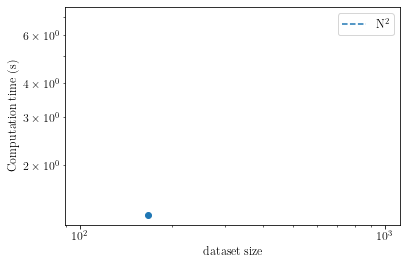

In [4]:
plt.scatter(N, times)
plt.plot(N, 0.00025*np.array(N)**2, linestyle="dashed", label=r"N$^2$")
plt.xlabel("dataset size")
plt.ylabel("Computation time (s)")
plt.yscale("log")
plt.xscale("log")
plt.legend()
plt.show()

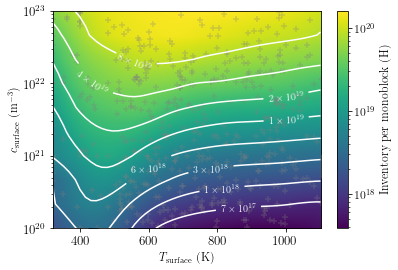

In [5]:
def scientificNotation(value):
    if value == 0:
        return '0'
    else:
        e = np.log10(np.abs(value))
        m = np.sign(value) * 10 ** (e - int(e))
        return r'${:.0f} \times 10^{{{:d}}}$'.format(m, int(e))
# plot mu
fig = plt.figure()
locator = ticker.LogLocator(base=10)
levels = np.logspace(
    min(mu),
    max(mu),
    1000)
levels2 = np.logspace(
    min(mu),
    max(mu),
    10)
# levels2 = np.delete(levels2, 4)
CS = plt.contourf(*np.meshgrid(gp_x, 10**gp_y), 10**mu.reshape([Nx, Ny]).T, locator=locator, levels=levels)
plt.colorbar(CS, label=r"Inventory per monoblock (H)", ticks=locator)
CS2 = plt.contour(
    *np.meshgrid(gp_x, 10**gp_y), 10**mu.reshape([Nx, Ny]).T, levels=levels2,
    locator=locator, colors="white")
manual_locations = [
    (861, 2e+20),
    (813, 3e+20),
    (781, 7e+20),
    (600, 7e+20),
    (1000, 3e+21),
    (1000, 5e+21),
    (431, 1e+22),
    (558, 2e+22)
    ]
CLS = plt.clabel(CS2, inline=True, fontsize=10, fmt=scientificNotation, manual=manual_locations)
plt.scatter(points3[:, 0], 10**np.array(points3[:, 1]), color=(0.5, 0.5, 0.5), alpha=0.3, marker="+")
plt.yscale("log")
plt.tick_params(axis='both', which='major', labelsize=13)
plt.xlabel(r"$T_\mathrm{surface}$ (K)", fontsize=12)
plt.ylabel(r"$c_\mathrm{surface}$ (m$^{-3}$)", fontsize=12)
for c in CS.collections:  # for avoiding white lines in pdf
        c.set_edgecolor("face")
plt.savefig("inv_with_points.svg")
plt.show()

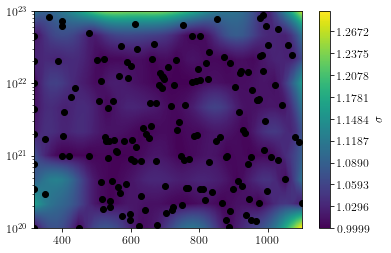

In [6]:
# plot sigma
fig = plt.figure()
levels = np.linspace(
    min(sig),
    max(sig), 
    1000)

X2, Y2 = np.meshgrid(
    np.linspace(320, 1100, num=100),
    np.logspace(20, 22+np.log10(7), num=100, endpoint=True))
CS = plt.contourf(*np.meshgrid(gp_x, 10**gp_y), 10**sig.reshape([Nx, Ny]).T, levels=1000)
plt.colorbar(CS, label=r"$\sigma$")

# overplot the data points
plt.scatter(points2[:, 0], 10**points2[:, 1], color='black')
plt.yscale("log")
plt.show()

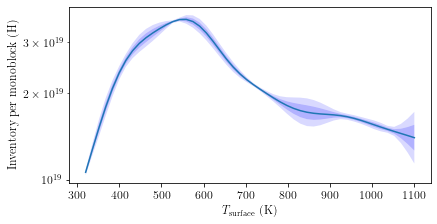

In [7]:
# plot profile along T axis
n = 0
for c in gp_y:
    n += 1
    if  2e21 < 10**c < 4e21:
        break
plt.figure(figsize=(6.48, 6.48/2))
mu_reshaped = mu.reshape([Nx, Ny]).T
sig_reshaped = sig.reshape([Nx, Ny]).T
plt.plot(gp_x, 10**mu_reshaped[n], label='posterior mean c_surf = {:.1e} m-3'.format(10**gp_y[n]))
plt.fill_between(
    gp_x, 10**(mu_reshaped[n]-sig_reshaped[n]), 10**(mu_reshaped[n]-sig_reshaped[n]*2),
    facecolor='blue', alpha=0.15, label=r'$\pm 2 \sigma$ interval')
plt.fill_between(
    gp_x, 10**(mu_reshaped[n]+sig_reshaped[n]), 10**(mu_reshaped[n]+sig_reshaped[n]*2),
    facecolor='blue', alpha=0.15)
plt.fill_between(
    gp_x, 10**(mu_reshaped[n]-sig_reshaped[n]), 10**(mu_reshaped[n]+sig_reshaped[n]),
    facecolor='blue', alpha=0.3, label=r'$\pm 1 \sigma$ interval')
# plt.legend()
plt.yscale("log")
plt.xlabel(r"$T_\mathrm{surface}$ (K)")
plt.ylabel(r"Inventory per monoblock (H)")
plt.show()


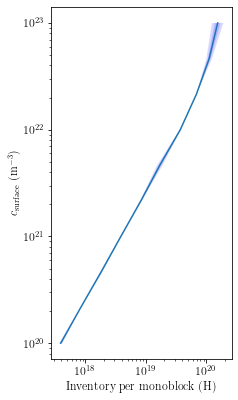

In [8]:
# plot profile along c axis
n = 0
for T in gp_x:
    n += 1
    if  840 < T < 840 + gp_x[1] - gp_x[0]:
        break
plt.figure(figsize=(6.48/2, 6.48))
mu_reshaped = mu.reshape([Nx, Ny]).T
sig_reshaped = sig.reshape([Nx, Ny]).T

plt.plot(10**mu_reshaped[:, n], 10**gp_y, label='posterior mean T_surf = {:.0f} K'.format(gp_x[n]))

plt.fill_betweenx(
    10**gp_y, 10**(mu_reshaped[:, n]-sig_reshaped[:, n]),
    10**(mu_reshaped[:, n]-sig_reshaped[:, n]*2),
    facecolor='blue', alpha=0.15, label=r'$\pm 2 \sigma$ interval')
plt.fill_betweenx(
    10**gp_y, 10**(mu_reshaped[:, n]+sig_reshaped[:, n]),
    10**(mu_reshaped[:, n]+sig_reshaped[:, n]*2),
    facecolor='blue', alpha=0.15)
plt.fill_betweenx(
    10**gp_y, 10**(mu_reshaped[:, n]-sig_reshaped[:, n]),
    10**(mu_reshaped[:, n]+sig_reshaped[:, n]),
    facecolor='blue', alpha=0.3, label=r'$\pm 1 \sigma$ interval')
# plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.xlabel(r"Inventory per monoblock (H)")
plt.ylabel(r"$c_\mathrm{surface}$ (m$^{-3}$)")
plt.show()

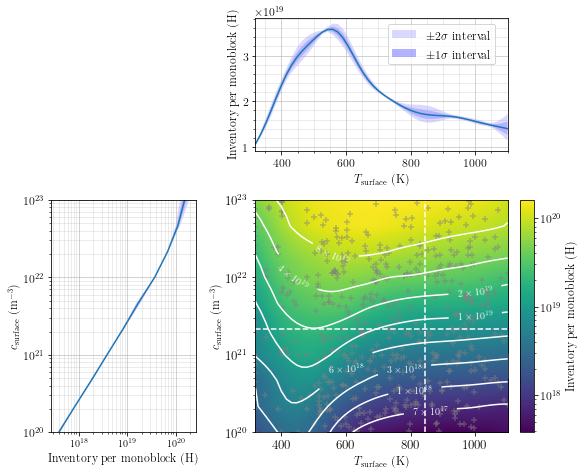

In [12]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(8, 6.48), constrained_layout=True,
                       gridspec_kw={
                           'width_ratios': [1.15, 2],
                           'height_ratios': [1.15, 2]})
# 0, 0
ax[0][0].axis('off')

# 0, 1
# plot profile along T axis
n = 0
for c in gp_y:
    n += 1
    if  2e21 < 10**c < 4e21:
        c_profile = 10**c
        break
mu_reshaped = mu.reshape([Nx, Ny]).T
sig_reshaped = sig.reshape([Nx, Ny]).T
ax[0][1].plot(gp_x, 10**mu_reshaped[n])
ax[0][1].fill_between(
    gp_x, 10**(mu_reshaped[n]-sig_reshaped[n]), 10**(mu_reshaped[n]-sig_reshaped[n]*2),
    facecolor='blue', alpha=0.15, label=r'$\pm 2 \sigma$ interval')
ax[0][1].fill_between(
    gp_x, 10**(mu_reshaped[n]+sig_reshaped[n]), 10**(mu_reshaped[n]+sig_reshaped[n]*2),
    facecolor='blue', alpha=0.15)
ax[0][1].fill_between(
    gp_x, 10**(mu_reshaped[n]-sig_reshaped[n]), 10**(mu_reshaped[n]+sig_reshaped[n]),
    facecolor='blue', alpha=0.3, label=r'$\pm 1 \sigma$ interval')
ax[0][1].legend(loc='upper left', bbox_to_anchor=(0.5, 1.00)) 
# ax[0][1].set_yscale("log")
ax[0][1].set_xlabel(r"$T_\mathrm{surface}$ (K)", fontsize=12)
ax[0][1].set_ylabel(r"Inventory per monoblock (H)", fontsize=12)
ax[0][1].tick_params(axis='both', which='major', labelsize=12)
ax[0][1].minorticks_on()
ax[0][1].grid(which='minor', alpha=0.3)
ax[0][1].grid(which='major', alpha=0.7)
ax[0][1].set_xlim(320, 1100)
# 1, 0
# plot profile along c axis
n = 0
for T in gp_x:
    n += 1
    if  840 < T < 840 + 2*(gp_x[1] - gp_x[0]):
        T_profile = T
        break
ax[1][0].plot(10**mu_reshaped[:, n], 10**gp_y)
ax[1][0].fill_betweenx(
    10**gp_y, 10**(mu_reshaped[:, n]-sig_reshaped[:, n]),
    10**(mu_reshaped[:, n]-sig_reshaped[:, n]*2),
    facecolor='blue', alpha=0.15, label=r'$\pm 2 \sigma$ interval')
ax[1][0].fill_betweenx(
    10**gp_y, 10**(mu_reshaped[:, n]+sig_reshaped[:, n]),
    10**(mu_reshaped[:, n]+sig_reshaped[:, n]*2),
    facecolor='blue', alpha=0.15)
ax[1][0].fill_betweenx(
    10**gp_y, 10**(mu_reshaped[:, n]-sig_reshaped[:, n]),
    10**(mu_reshaped[:, n]+sig_reshaped[:, n]),
    facecolor='blue', alpha=0.3, label=r'$\pm 1 \sigma$ interval')
ax[1][0].set_xscale("log")
ax[1][0].set_yscale("log")
ax[1][0].set_xlabel(r"Inventory per monoblock (H)", fontsize=12)
ax[1][0].set_ylabel(r"$c_\mathrm{surface}$ (m$^{-3}$)", fontsize=12)
ax[1][0].tick_params(axis='y', which='major', labelsize=12)
ax[1][0].tick_params(axis='x', which='major', labelsize=10)
ax[1][0].minorticks_on()
ax[1][0].grid(which='minor', alpha=0.3)
ax[1][0].grid(which='major', alpha=0.7)
ax[1][0].set_ylim(1e20, 1e23)
# 1, 1
locator = ticker.LogLocator(base=10)
levels = np.logspace(
    min(mu),
    max(mu),
    1000)
levels2 = np.logspace(
    min(mu),
    max(mu),
    10)
CS = ax[1][1].contourf(*np.meshgrid(gp_x, 10**gp_y), 10**mu.reshape([Nx, Ny]).T, locator=locator, levels=levels)
fig.colorbar(CS, label=r"Inventory per monoblock (H)", ticks=locator, ax=ax[1][1])
CS2 = ax[1][1].contour(
    *np.meshgrid(gp_x, 10**gp_y), 10**mu.reshape([Nx, Ny]).T, levels=levels2,
    locator=locator, colors="white")
manual_locations = [
    (861, 2e+20),
    (813, 3e+20),
    (781, 7e+20),
    (600, 7e+20),
    (1000, 3e+21),
    (1000, 5e+21),
    (431, 1e+22),
    (558, 2e+22)
    ]
CLS = ax[1][1].clabel(CS2, inline=True, fontsize=10, fmt=scientificNotation, manual=manual_locations)
ax[1][1].scatter(points3[:, 0], 10**np.array(points3[:, 1]), color=(0.5, 0.5, 0.5), alpha=0.5, marker="+")
ax[1][1].axvline(x=T_profile, linestyle="dashed", color="white")
ax[1][1].axhline(y=c_profile, linestyle="dashed", color="white")
ax[1][1].set_yscale("log")
ax[1][1].set_xlabel(r"$T_\mathrm{surface}$ (K)", fontsize=12)
ax[1][1].set_ylabel(r"$c_\mathrm{surface}$ (m$^{-3}$)", fontsize=12)
ax[1][1].tick_params(axis='both', which='major', labelsize=13)
for c in CS.collections:  # for avoiding white lines in pdf
        c.set_edgecolor("face")

plt.savefig("Figures/inventory_T_c_profiles.pdf")
plt.show()